In [1]:
# Denoising Diffusion Probabilistic Model (DDPM) from scratch using the CIFAR-10 dataset (32×32 RGB images)
# Made by Avi Mathur 

In [2]:
!pip install torch torchvision --quiet
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [3]:
# CIFAR-10 mean and std for mapping [0,1] -> [-1,1]
transform = transforms.Compose([
    transforms.ToTensor(),                          # [0,1]
    transforms.Normalize((0.5, 0.5, 0.5),           # mean
                         (0.5, 0.5, 0.5))           # std  → [-1,1]
])

# Download & load training set
train_dataset = datasets.CIFAR10(
    root="./data",
    train=True,
    download=True,
    transform=transform
)

batch_size = 128

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print("Number of training images:", len(train_dataset))


100%|██████████| 170M/170M [00:05<00:00, 29.3MB/s]


Number of training images: 50000


In [5]:
def denormalize(img_tensor):
    """
    img_tensor: (B, 3, H, W) with values in [-1, 1]
    returns: same shape, values in [0, 1]
    """
    return img_tensor * 0.5 + 0.5

def show_batch(images, nrow=8, title="Training images"):
    """
    images: (B, 3, H, W) tensor (already on CPU)
    """
    images = denormalize(images)  # back to [0,1]
    grid = make_grid(images, nrow=nrow)
    npimg = grid.permute(1, 2, 0).numpy()  # CHW -> HWC

    plt.figure(figsize=(8, 8))
    plt.imshow(npimg)
    plt.axis("off")
    plt.title(title)
    plt.show()


Batch shape: torch.Size([128, 3, 32, 32])
Labels example: tensor([4, 4, 0, 4, 1, 5, 1, 5, 5, 0, 5, 5, 5, 0, 1, 5])


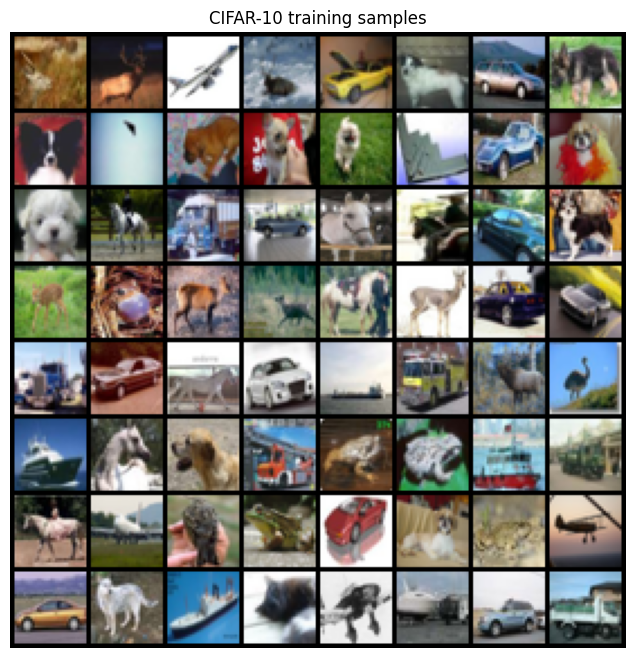

In [6]:
# Grab one batch
batch = next(iter(train_loader))
images, labels = batch  # images: (B, 3, 32, 32) in [-1,1]
print("Batch shape:", images.shape)
print("Labels example:", labels[:16])

# Move to CPU for plotting
show_batch(images[:64].cpu(), nrow=8, title="CIFAR-10 training samples")


In [7]:
import torch

# Number of diffusion steps
T = 1000

# Linear beta schedule: β_t ∈ [1e-4, 0.02]
beta_start = 1e-4
beta_end   = 0.02

betas = torch.linspace(beta_start, beta_end, T, dtype=torch.float32).to(device)  # (T,)

# α_t = 1 - β_t
alphas = 1.0 - betas  # (T,)

# ᾱ_t = ∏_{i=1}^t α_i  (cumulative product)
alphas_cumprod = torch.cumprod(alphas, dim=0)  # (T,)

# Precompute sqrt(ᾱ_t) and sqrt(1 - ᾱ_t)
sqrt_alphas_cumprod        = torch.sqrt(alphas_cumprod)             # (T,)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)    # (T,)

print("betas shape:", betas.shape)
print("alphas_cumprod[0:5]:", alphas_cumprod[:5])


betas shape: torch.Size([1000])
alphas_cumprod[0:5]: tensor([0.9999, 0.9998, 0.9996, 0.9995, 0.9993], device='cuda:0')


In [8]:
def extract(a, t, x_shape):
    """
    a:      1D tensor of length T (e.g., sqrt_alphas_cumprod)
    t:      (B,) tensor of timesteps (long)
    x_shape: shape of x (B, C, H, W)

    returns: (B, 1, 1, 1) tensor with the values of a at indices t
    """
    B = t.shape[0]
    out = a.gather(-1, t)  # (B,)
    return out.reshape(B, 1, 1, 1)


In [9]:
def q_sample(x0, t, noise=None):
    """
    x0:   (B, 3, 32, 32) original images in [-1, 1]
    t:    (B,) timesteps, each in [0, T-1]
    noise:(B, 3, 32, 32), standard normal N(0,1)

    returns: x_t ~ q(x_t | x_0)
    """
    if noise is None:
        noise = torch.randn_like(x0)

    # sqrt(alphā_t) and sqrt(1-alphā_t) for each t in batch
    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x0.shape)              # (B,1,1,1)
    sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x0.shape)

    # Equation (1)
    return sqrt_alphas_cumprod_t * x0 + \
           sqrt_one_minus_alphas_cumprod_t * noise


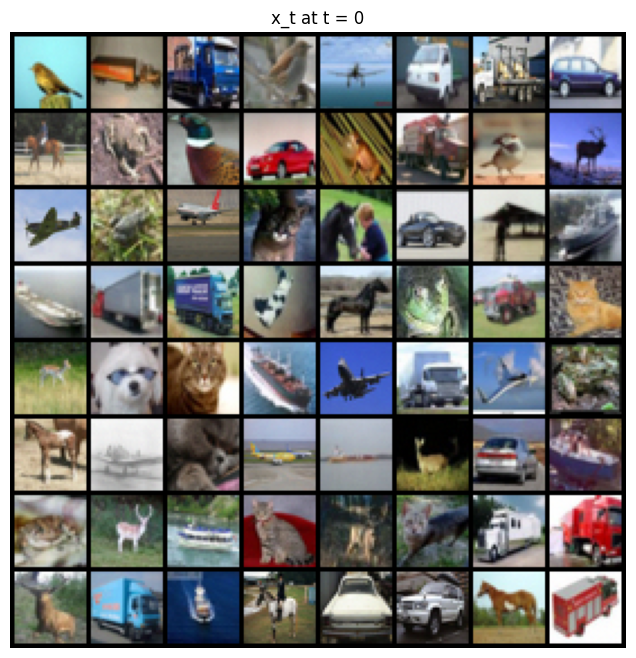

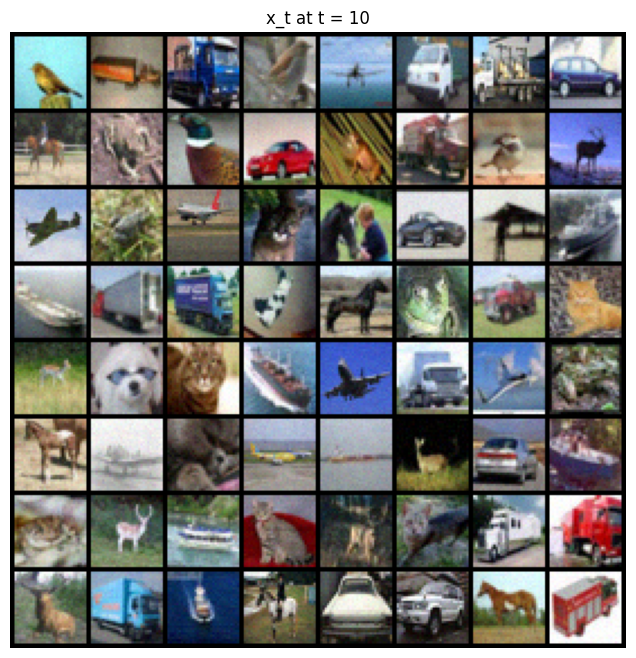

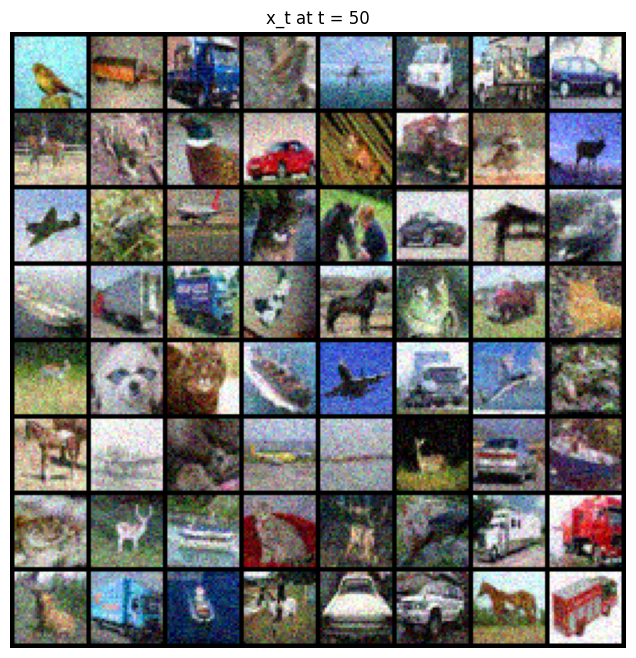

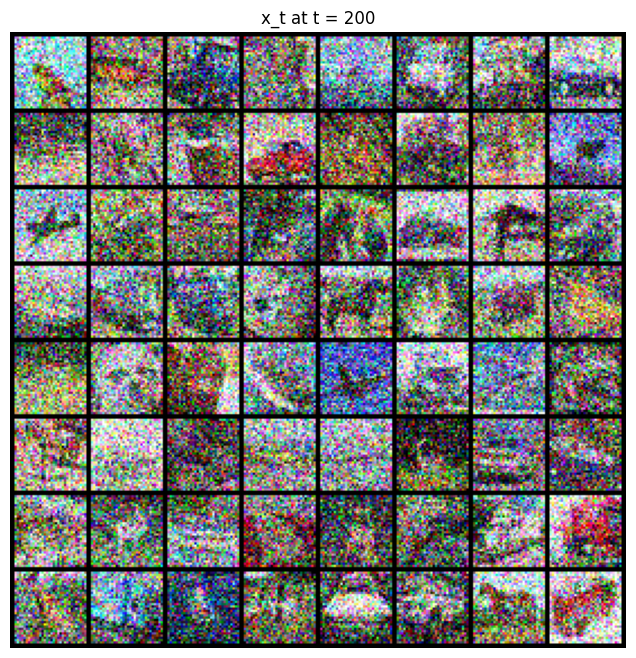

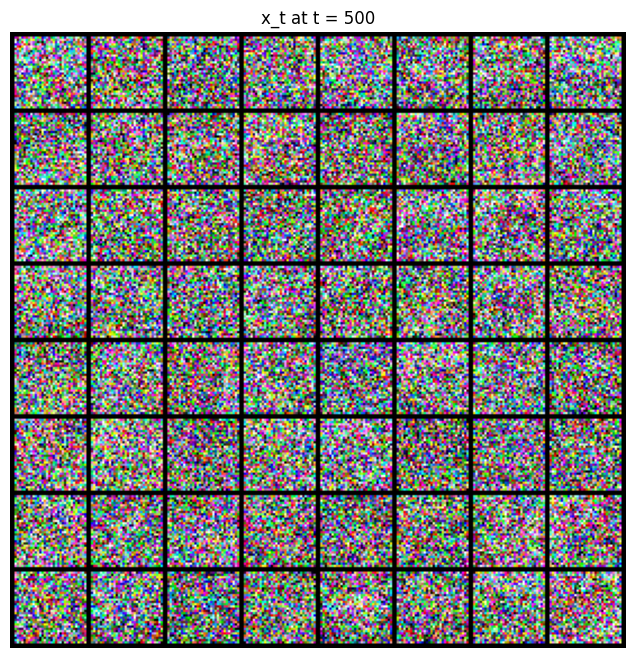

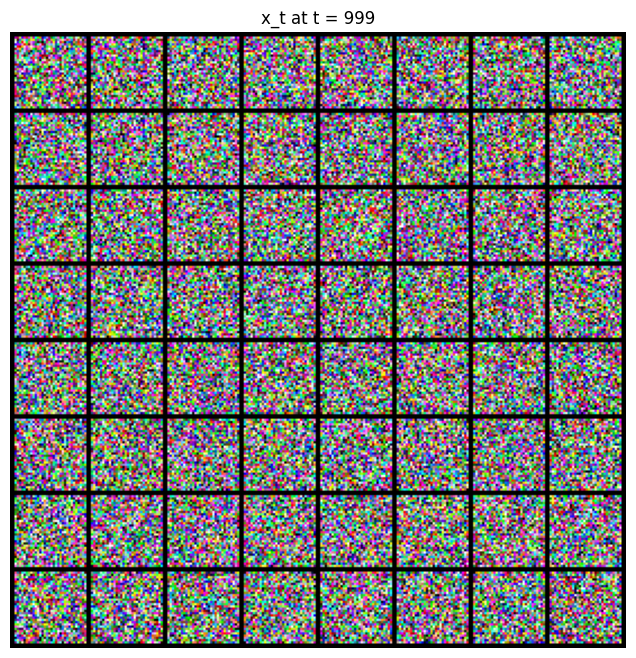

In [10]:
# Grab one batch of training images
x0, _ = next(iter(train_loader))  # x0: (B, 3, 32, 32), in [-1,1]
x0 = x0.to(device)

# Fixed noise tensor
noise = torch.randn_like(x0)

# Timesteps to visualize
timesteps_to_show = [0, 10, 50, 200, 500, 999]

for t_val in timesteps_to_show:
    # (B,) tensor filled with t_val
    t = torch.full((x0.size(0),), t_val, device=device, dtype=torch.long)

    xt = q_sample(x0, t, noise=noise)                 # (B,3,32,32)
    xt = torch.clamp(xt, -1.0, 1.0)                 

    # Show first 64 images
    show_batch(xt[:64].cpu(), nrow=8, title=f"x_t at t = {t_val}")


In [11]:
import math
import torch
import torch.nn as nn

def timestep_embedding(timesteps, dim, max_period=10000):
    """
    Create sinusoidal timestep embeddings.

    timesteps: (B,) int64 tensor with time indices
    dim:       embedding dimension
    returns:   (B, dim) float32 tensor
    """
    # Ensure float
    timesteps = timesteps.float()  # (B,)

    half = dim // 2
    # Log-spaced frequencies
    freqs = torch.exp(
        -math.log(max_period) * torch.arange(0, half, dtype=torch.float32, device=timesteps.device) / half
    )  # (half,)

    # Outer product: (B,1) * (1,half) -> (B, half)
    args = timesteps[:, None] * freqs[None, :]  # (B, half)

    # [cos, sin]
    emb = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)  # (B, 2*half)

    # If dim is odd, pad one zero
    if dim % 2 == 1:
        emb = torch.cat([emb, torch.zeros_like(emb[:, :1])], dim=-1)

    return emb  # (B, dim)


In [12]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_dim, groups=8):
        super().__init__()
        self.norm1 = nn.GroupNorm(groups, in_channels)
        self.act1  = nn.SiLU()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)

        self.norm2 = nn.GroupNorm(groups, out_channels)
        self.act2  = nn.SiLU()
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)

        # Project time embedding to out_channels and add after first conv
        self.time_proj = nn.Linear(time_dim, out_channels)

        # Skip connection to handle channel changes
        if in_channels != out_channels:
            self.skip_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        else:
            self.skip_conv = None

    def forward(self, x, t_emb):
        """
        x:     (B, C, H, W)
        t_emb: (B, time_dim)
        """
        h = self.conv1(self.act1(self.norm1(x)))

        # Inject timestep embedding
        time_out = self.time_proj(t_emb)  # (B, out_channels)
        h = h + time_out[:, :, None, None]  # broadcast over H,W

        h = self.conv2(self.act2(self.norm2(h)))

        if self.skip_conv is not None:
            x = self.skip_conv(x)

        return x + h


In [13]:
class SelfAttention(nn.Module):
    def __init__(self, channels, groups=8):
        super().__init__()
        self.norm = nn.GroupNorm(groups, channels)
        self.q = nn.Conv1d(channels, channels, kernel_size=1)
        self.k = nn.Conv1d(channels, channels, kernel_size=1)
        self.v = nn.Conv1d(channels, channels, kernel_size=1)
        self.proj = nn.Conv1d(channels, channels, kernel_size=1)

    def forward(self, x):
        """
        x: (B, C, H, W)
        """
        B, C, H, W = x.shape
        h = self.norm(x)

        # Flatten spatially: (B, C, H*W)
        h = h.view(B, C, H * W)

        q = self.q(h)  # (B, C, HW)
        k = self.k(h)  # (B, C, HW)
        v = self.v(h)  # (B, C, HW)

        # Attention: (B, HW, HW)
        attn_scores = torch.bmm(q.transpose(1, 2), k) / math.sqrt(C)
        attn = torch.softmax(attn_scores, dim=-1)

        out = torch.bmm(attn, v.transpose(1, 2))  # (B, HW, C)
        out = out.transpose(1, 2)  # (B, C, HW)
        out = self.proj(out)       # (B, C, HW)

        out = out.view(B, C, H, W)

        return x + out  # residual


In [14]:
class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(
            in_channels, out_channels,
            kernel_size=4, stride=2, padding=1
        )  # 32->16->8->4

    def forward(self, x):
        return self.conv(x)


class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv = nn.Conv2d(
            in_channels, out_channels,
            kernel_size=3, padding=1
        )

    def forward(self, x):
        x = self.upsample(x)
        return self.conv(x)


In [15]:
# Assuming we have: betas, alphas, alphas_cumprod

# We also need:
alphas_cumprod_prev = torch.cat(
    [torch.tensor([1.0], device=device), alphas_cumprod[:-1]], dim=0
)  # (T,)

sqrt_recip_alphas = torch.sqrt(1.0 / alphas)  # (T,)

posterior_variance = betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)


In [16]:
import torch.nn.functional as F

def p_losses(denoise_model, x0, t, noise=None):
    """
    One training step loss:
    - sample noise
    - form x_t using q_sample
    - predict noise
    - return MSE(ε, ε_pred)
    """
    if noise is None:
        noise = torch.randn_like(x0)

    # Forward diffusion: x_t = q(x_t | x_0)
    x_t = q_sample(x0, t, noise=noise)

    # Predict noise εθ(x_t, t)
    eps_pred = denoise_model(x_t, t)

    # MSE between true noise and predicted noise
    loss = F.mse_loss(eps_pred, noise)
    return loss


In [17]:
import math
import torch
import torch.nn as nn

# Timestep embedding
def timestep_embedding(timesteps, dim, max_period=10000):
    """
    timesteps: (B,) int64
    dim: embedding dim
    returns: (B, dim)
    """
    timesteps = timesteps.float()
    half = dim // 2
    freqs = torch.exp(
        -math.log(max_period) * torch.arange(0, half, dtype=torch.float32, device=timesteps.device) / half
    )
    args = timesteps[:, None] * freqs[None, :]
    emb = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)
    if dim % 2 == 1:
        emb = torch.cat([emb, torch.zeros_like(emb[:, :1])], dim=-1)
    return emb  # (B, dim)

# ResBlock with time injection 
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_dim, groups=8):
        super().__init__()
        self.norm1 = nn.GroupNorm(groups, in_channels)
        self.act1  = nn.SiLU()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)

        self.norm2 = nn.GroupNorm(groups, out_channels)
        self.act2  = nn.SiLU()
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)

        self.time_proj = nn.Linear(time_dim, out_channels)

        if in_channels != out_channels:
            self.skip_conv = nn.Conv2d(in_channels, out_channels, 1)
        else:
            self.skip_conv = None

    def forward(self, x, t_emb):
        h = self.conv1(self.act1(self.norm1(x)))
        time_out = self.time_proj(t_emb)  # (B, C_out)
        h = h + time_out[:, :, None, None]
        h = self.conv2(self.act2(self.norm2(h)))
        if self.skip_conv is not None:
            x = self.skip_conv(x)
        return x + h

# Self-attention 
class SelfAttention(nn.Module):
    def __init__(self, channels, groups=8):
        super().__init__()
        self.norm = nn.GroupNorm(groups, channels)
        self.q = nn.Conv1d(channels, channels, 1)
        self.k = nn.Conv1d(channels, channels, 1)
        self.v = nn.Conv1d(channels, channels, 1)
        self.proj = nn.Conv1d(channels, channels, 1)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x).view(B, C, H * W)

        q = self.q(h)            # (B, C, HW)
        k = self.k(h)            # (B, C, HW)
        v = self.v(h)            # (B, C, HW)

        attn = torch.bmm(q.transpose(1, 2), k) / math.sqrt(C)  # (B, HW, HW)
        attn = torch.softmax(attn, dim=-1)

        out = torch.bmm(attn, v.transpose(1, 2))  # (B, HW, C)
        out = out.transpose(1, 2)                 # (B, C, HW)
        out = self.proj(out)
        out = out.view(B, C, H, W)

        return x + out

# Down & Up sampling 
class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, 4, stride=2, padding=1)

    def forward(self, x):
        return self.conv(x)

class Upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode="nearest")
        self.conv = nn.Conv2d(in_channels, out_channels, 3, padding=1)

    def forward(self, x):
        x = self.upsample(x)
        return self.conv(x)

# Full UNet 
class UNet(nn.Module):
    def __init__(self, in_channels=3, base_channels=64, time_dim=256):
        super().__init__()
        self.time_dim = time_dim

        # time embedding MLP
        self.time_mlp = nn.Sequential(
            nn.Linear(time_dim, time_dim),
            nn.SiLU(),
            nn.Linear(time_dim, time_dim),
        )

        # initial conv
        self.init_conv = nn.Conv2d(in_channels, base_channels, 3, padding=1)

        # Down 1: 32x32, 64ch
        self.down1_1 = ResBlock(base_channels, base_channels, time_dim)
        self.down1_2 = ResBlock(base_channels, base_channels, time_dim)
        self.down1_down = Downsample(base_channels, base_channels * 2)   # 64 -> 128

        # Down 2: 16x16, 128ch + attn
        self.down2_1 = ResBlock(base_channels * 2, base_channels * 2, time_dim)
        self.down2_2 = ResBlock(base_channels * 2, base_channels * 2, time_dim)
        self.down2_attn = SelfAttention(base_channels * 2)
        self.down2_down = Downsample(base_channels * 2, base_channels * 4)  # 128 -> 256

        # Down 3: 8x8, 256ch + attn
        self.down3_1 = ResBlock(base_channels * 4, base_channels * 4, time_dim)
        self.down3_2 = ResBlock(base_channels * 4, base_channels * 4, time_dim)
        self.down3_attn = SelfAttention(base_channels * 4)
        self.down3_down = Downsample(base_channels * 4, base_channels * 4)  # 256 -> 256 (4x4)

        # Bottleneck: 4x4, 256ch
        self.bot1 = ResBlock(base_channels * 4, base_channels * 4, time_dim)
        self.bot_attn = SelfAttention(base_channels * 4)
        self.bot2 = ResBlock(base_channels * 4, base_channels * 4, time_dim)

        # Up 3: 4x4 -> 8x8
        self.up3_up = Upsample(base_channels * 4, base_channels * 4)
        self.up3_1 = ResBlock(base_channels * 4 + base_channels * 4, base_channels * 4, time_dim)
        self.up3_2 = ResBlock(base_channels * 4, base_channels * 4, time_dim)
        self.up3_attn = SelfAttention(base_channels * 4)

        # Up 2: 8x8 -> 16x16
        self.up2_up = Upsample(base_channels * 4, base_channels * 2)
        self.up2_1 = ResBlock(base_channels * 2 + base_channels * 2, base_channels * 2, time_dim)
        self.up2_2 = ResBlock(base_channels * 2, base_channels * 2, time_dim)
        self.up2_attn = SelfAttention(base_channels * 2)

        # Up 1: 16x16 -> 32x32
        self.up1_up = Upsample(base_channels * 2, base_channels)
        self.up1_1 = ResBlock(base_channels + base_channels, base_channels, time_dim)
        self.up1_2 = ResBlock(base_channels, base_channels, time_dim)

        # Final output
        self.final_norm = nn.GroupNorm(8, base_channels)
        self.final_act  = nn.SiLU()
        self.final_conv = nn.Conv2d(base_channels, in_channels, 3, padding=1)

    def forward(self, x, t):
        # time embedding
        t_emb = timestep_embedding(t, self.time_dim)
        t_emb = self.time_mlp(t_emb)

        # initial
        x = self.init_conv(x)

        # Down 1
        x1 = self.down1_1(x, t_emb)
        x1 = self.down1_2(x1, t_emb)
        x  = self.down1_down(x1)

        # Down 2
        x2 = self.down2_1(x, t_emb)
        x2 = self.down2_2(x2, t_emb)
        x2 = self.down2_attn(x2)
        x  = self.down2_down(x2)

        # Down 3
        x3 = self.down3_1(x, t_emb)
        x3 = self.down3_2(x3, t_emb)
        x3 = self.down3_attn(x3)
        x  = self.down3_down(x3)

        # Bottleneck
        x = self.bot1(x, t_emb)
        x = self.bot_attn(x)
        x = self.bot2(x, t_emb)

        # Up 3
        x = self.up3_up(x)
        x = torch.cat([x, x3], dim=1)
        x = self.up3_1(x, t_emb)
        x = self.up3_2(x, t_emb)
        x = self.up3_attn(x)

        # Up 2
        x = self.up2_up(x)
        x = torch.cat([x, x2], dim=1)
        x = self.up2_1(x, t_emb)
        x = self.up2_2(x, t_emb)
        x = self.up2_attn(x)

        # Up 1
        x = self.up1_up(x)
        x = torch.cat([x, x1], dim=1)
        x = self.up1_1(x, t_emb)
        x = self.up1_2(x, t_emb)

        # Final
        x = self.final_conv(self.final_act(self.final_norm(x)))
        return x


In [18]:
model = UNet(in_channels=3, base_channels=64, time_dim=256).to(device)
print("UNet defined, params:", sum(p.numel() for p in model.parameters()) / 1e6, "M")


UNet defined, params: 13.828291 M


In [19]:
B = 4
x_t = torch.randn(B, 3, 32, 32, device=device)
t   = torch.randint(0, T, (B,), device=device).long()

with torch.no_grad():
    eps_pred = model(x_t, t)

print("eps_pred shape:", eps_pred.shape)  # should be [4, 3, 32, 32]


eps_pred shape: torch.Size([4, 3, 32, 32])


In [20]:
# Sampling utils

import torch

def extract(a, t, x_shape):
    """
    a:      1D tensor of length T
    t:      (B,) long tensor of indices in [0, T-1]
    x_shape: shape of x (B, C, H, W)
    returns: (B, 1, 1, 1) with values chosen from a at indices t
    """
    B = t.shape[0]
    out = a.gather(-1, t)  # (B,)
    return out.reshape(B, 1, 1, 1)

# extra precomputations for reverse process 

alphas_cumprod_prev = torch.cat(
    [torch.tensor([1.0], device=device), alphas_cumprod[:-1]], dim=0
)  # (T,)

sqrt_recip_alphas = torch.sqrt(1.0 / alphas)  # (T,)

posterior_variance = betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)
# posterior_variance: (T,)


def p_sample(model, x_t, t):
    """
    One reverse DDPM step: x_t -> x_{t-1}

    x_t: (B, 3, 32, 32)
    t:   (B,) long tensor, all same timestep value per batch
    """
    # Predict noise ε_θ(x_t, t)
    eps_theta = model(x_t, t)

    # Extract scalars for timestep in broadcastable shape
    sqrt_recip_alpha_t = extract(sqrt_recip_alphas, t, x_t.shape)
    alpha_t            = extract(alphas, t, x_t.shape)
    alpha_bar_t        = extract(alphas_cumprod, t, x_t.shape)
    one_minus_alpha_bar_t = 1.0 - alpha_bar_t
    posterior_var_t    = extract(posterior_variance, t, x_t.shape)

    # μ_t = 1/sqrt(α_t) [ x_t - (1-α_t)/sqrt(1-ᾱ_t) * ε_θ ]
    coef_eps = (1.0 - alpha_t) / torch.sqrt(one_minus_alpha_bar_t)
    mean = sqrt_recip_alpha_t * (x_t - coef_eps * eps_theta)

    # Sample noise only if t > 0 (for t == 0 we just return the mean)
    noise = torch.randn_like(x_t)
    nonzero_mask = (t != 0).float().view(-1, 1, 1, 1)  # 0 when t=0, else 1

    x_prev = mean + nonzero_mask * torch.sqrt(posterior_var_t) * noise
    return x_prev


def sample_ddpm(model, n=16):
    """
    Generate n samples from the DDPM model.

    Returns: (n, 3, 32, 32) tensor in [-1, 1]
    """
    model.eval()
    x_t = torch.randn(n, 3, 32, 32, device=device)  # start from x_T ~ N(0, I)

    for t_step in reversed(range(T)):
        t = torch.full((n,), t_step, device=device, dtype=torch.long)
        x_t = p_sample(model, x_t, t)

    x_0 = torch.clamp(x_t, -1.0, 1.0)
    return x_0


Epoch [1/20] - Loss: 0.0979
Epoch [2/20] - Loss: 0.0460
Epoch [3/20] - Loss: 0.0404
Epoch [4/20] - Loss: 0.0381
Epoch [5/20] - Loss: 0.0377
Saved checkpoint: ./ddpm_checkpoints/ddpm_unet_epoch_5.pth


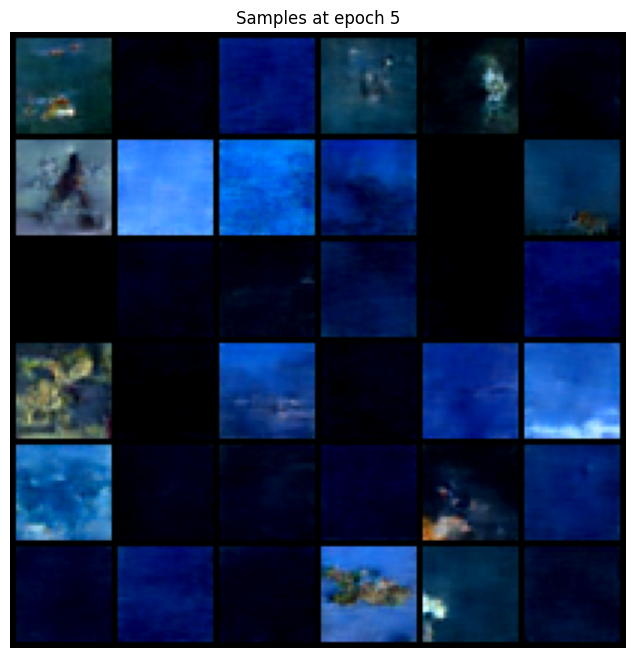

Epoch [6/20] - Loss: 0.0360
Epoch [7/20] - Loss: 0.0352
Epoch [8/20] - Loss: 0.0348
Epoch [9/20] - Loss: 0.0349
Epoch [10/20] - Loss: 0.0348
Saved checkpoint: ./ddpm_checkpoints/ddpm_unet_epoch_10.pth


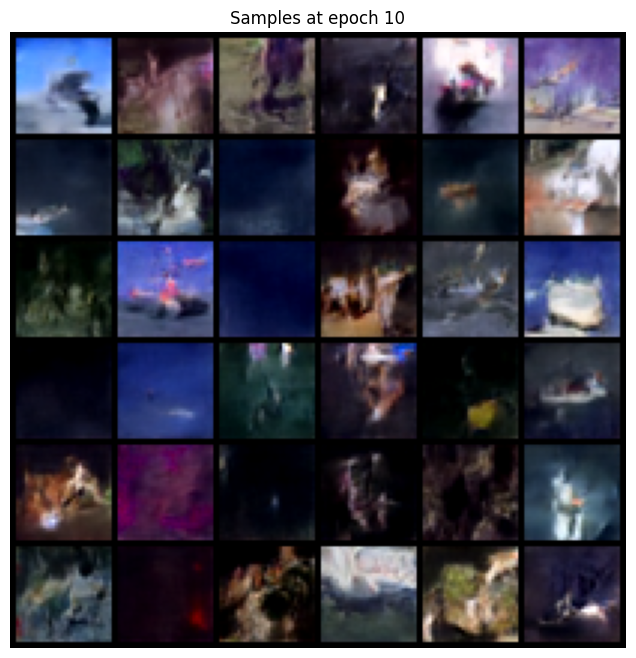

Epoch [11/20] - Loss: 0.0346
Epoch [12/20] - Loss: 0.0340
Epoch [13/20] - Loss: 0.0339
Epoch [14/20] - Loss: 0.0331
Epoch [15/20] - Loss: 0.0327
Saved checkpoint: ./ddpm_checkpoints/ddpm_unet_epoch_15.pth


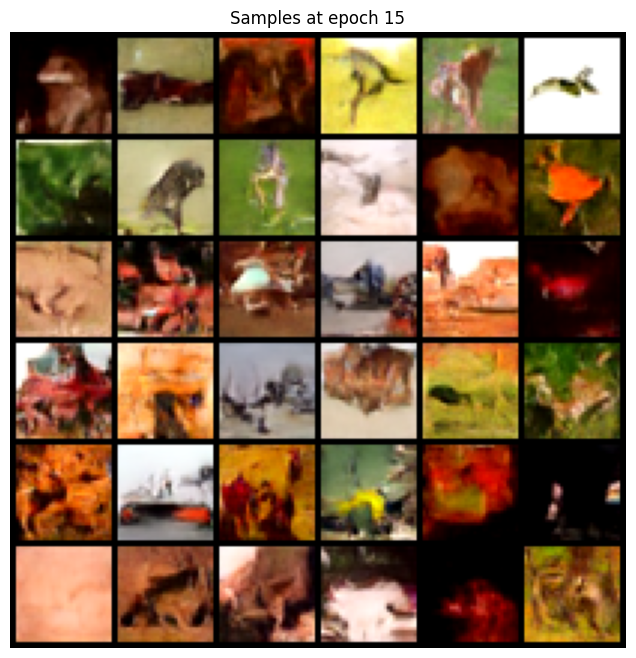

Epoch [16/20] - Loss: 0.0324
Epoch [17/20] - Loss: 0.0334
Epoch [18/20] - Loss: 0.0329
Epoch [19/20] - Loss: 0.0328
Epoch [20/20] - Loss: 0.0330
Saved checkpoint: ./ddpm_checkpoints/ddpm_unet_epoch_20.pth


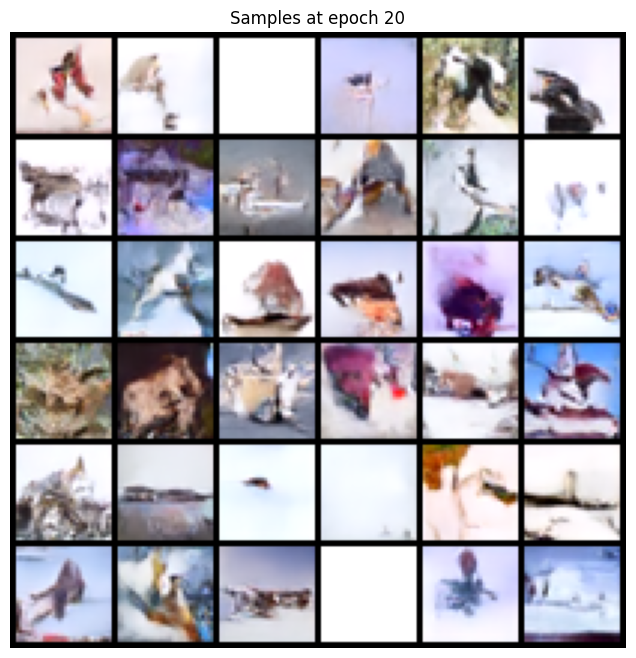

In [21]:
from torch.optim import Adam
import os

epochs = 20
lr = 2e-4

model = UNet(in_channels=3, base_channels=64, time_dim=256).to(device)
optimizer = Adam(model.parameters(), lr=lr)

save_dir = "./ddpm_checkpoints"
os.makedirs(save_dir, exist_ok=True)

loss_history = []

for epoch in range(1, epochs + 1):
    model.train()
    epoch_loss = 0.0
    num_batches = 0

    for x0, _ in train_loader:
        x0 = x0.to(device)  # (B, 3, 32, 32)

        # 1. Sample t ~ Uniform{0, ..., T-1}
        t = torch.randint(0, T, (x0.size(0),), device=device).long()

        # 2–5. Compute loss
        loss = p_losses(model, x0, t)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        num_batches += 1

    avg_loss = epoch_loss / num_batches
    loss_history.append(avg_loss)
    print(f"Epoch [{epoch}/{epochs}] - Loss: {avg_loss:.4f}")

    # Save checkpoint 
    if epoch % 5 == 0:
        ckpt_path = os.path.join(save_dir, f"ddpm_unet_epoch_{epoch}.pth")
        torch.save(model.state_dict(), ckpt_path)
        print(f"Saved checkpoint: {ckpt_path}")

    # Generate samples
    if epoch % 5 == 0:
        model.eval()
        with torch.no_grad():
            samples = sample_ddpm(model, n=36)  # defined below
        show_batch(samples.cpu(), nrow=6, title=f"Samples at epoch {epoch}")


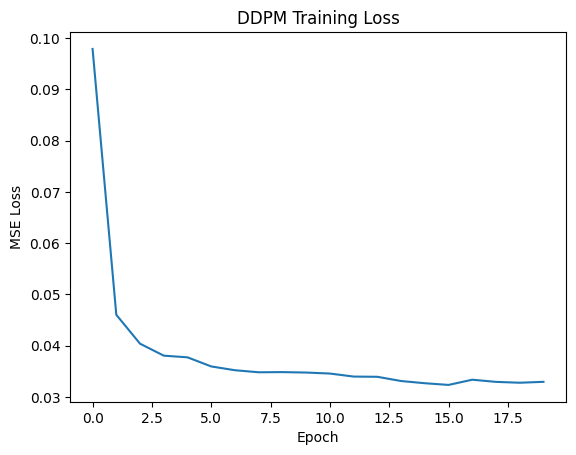

In [22]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(loss_history)
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("DDPM Training Loss")
plt.show()


In [23]:
def p_sample(model, x_t, t):
    """
    Take one reverse diffusion step: x_t -> x_{t-1}

    x_t: (B, 3, 32, 32)
    t:   (B,) long, all have the same timestep value
    """
    # Predicted noise εθ(x_t, t)
    eps_theta = model(x_t, t)

    # All necessary coefficients for this t
    sqrt_recip_alpha_t = extract(sqrt_recip_alphas, t, x_t.shape)          # (B,1,1,1)
    beta_t             = extract(betas, t, x_t.shape)
    alpha_t            = extract(alphas, t, x_t.shape)
    alpha_bar_t        = extract(alphas_cumprod, t, x_t.shape)
    one_minus_alpha_bar_t = extract(1.0 - alphas_cumprod, t, x_t.shape)
    posterior_var_t    = extract(posterior_variance, t, x_t.shape)

    # Mean term μ_t(x_t, εθ)
    # μ_t = 1/sqrt(α_t) [ x_t - (1-α_t)/sqrt(1-ᾱ_t) * εθ ]
    coef_eps = (1.0 - alpha_t) / torch.sqrt(one_minus_alpha_bar_t)
    mean = sqrt_recip_alpha_t * (x_t - coef_eps * eps_theta)

    # For t > 0, add noise
    # For t = 0, we return mean (final x_0)
    noise = torch.randn_like(x_t)

    nonzero_mask = (t != 0).float().view(-1, 1, 1, 1)  # 0 if t==0, else 1

    sample = mean + nonzero_mask * torch.sqrt(posterior_var_t) * noise
    return sample


In [24]:
def sample_ddpm(model, n=16):
    """
    Generate n samples from the DDPM model.
    Returns a tensor of shape (n, 3, 32, 32) in [-1, 1].
    """
    model.eval()
    x_t = torch.randn(n, 3, 32, 32, device=device)  # x_T ~ N(0, I)

    for t_ in reversed(range(T)):
        t = torch.full((n,), t_, device=device, dtype=torch.long)
        x_t = p_sample(model, x_t, t)

    # x_t is now x_0. Clamp for stability
    x_0 = torch.clamp(x_t, -1.0, 1.0)
    return x_0


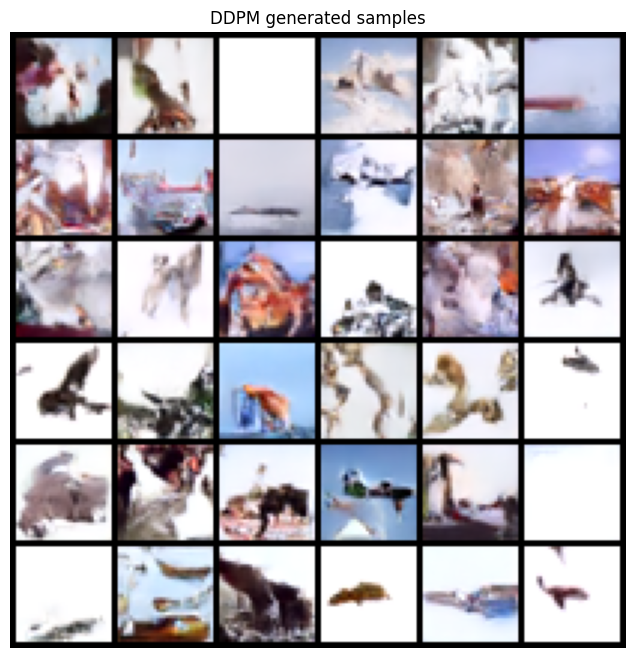

In [25]:
with torch.no_grad():
    samples = sample_ddpm(model, n=36)

# `samples` are in [-1,1], same as training images
show_batch(samples.cpu(), nrow=6, title="DDPM generated samples")
